In [1]:
import os
import re
import random
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import tifffile
import matplotlib.pyplot as plt

import sys
_REPO = Path.cwd().parent
if str(_REPO) not in sys.path:
    sys.path.insert(0, str(_REPO))

from alignment import caiman_memmap_reader, minmax_scaler
from registration import sitkalignment

# Piecewise registration uses SimpleITK Elastix + image blackout (no CLI masks required).
_elastix = sitkalignment.elastix_executable_info()
if _elastix["path"]:
    print(f"Optional elastix CLI (register_image2 use_elastix_cli=True): {_elastix['path']}")

cv2 not available
Optional elastix CLI (register_image2 use_elastix_cli=True): /Users/elysiaye/alignment/tools/elastix/bin/elastix


### Set up folder and select fish to align

In [2]:
# Optional quick setup (main config is in the dedicated config cell below)
data_folder = Path('/Volumes/Kobi/DOI_animals_good')
fish_name = 'elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007'
plane = 0
selected_plane = 0

exp_folder = data_folder / fish_name
_mcorr_dir = exp_folder / 'mcorr_tiff_outputs'
if not _mcorr_dir.is_dir():
    raise FileNotFoundError(f"Missing mcorr output folder: {_mcorr_dir}")
_std_plane_re = re.compile(r'plane(\d+)', re.IGNORECASE)
_matches = [
    p
    for p in _mcorr_dir.glob('STD*')
    if p.is_file() and (m := _std_plane_re.search(p.name)) and int(m.group(1)) == selected_plane
]
if not _matches:
    _std_names = sorted(p.name for p in _mcorr_dir.glob('STD*') if p.is_file())
    raise FileNotFoundError(
        f"No STD* file in {_mcorr_dir} with plane index {selected_plane}. Found STD files: {_std_names}"
    )
if len(_matches) > 1:
    raise ValueError(f"Multiple STD* files match plane{selected_plane}: {_matches}")
external_std_tiff = _matches[0]

### Load and preview experiment plane

Loads the motion-corrected **STD** projection for `selected_plane`, normalizes to max and scales by `2**10`.

Defines **`experiment_std_scaled`** (native STD orientation). The next cell applies an optional **clockwise** fine rotation, then **`rot90` + `embed_image(1024)`** to define **`plot_img`** for registration.


STD file: STD_mcorr_plane0_idx1_strides(160, 160)_overlaps(60, 60)_maxshifts(10, 10)_maxdev10.tif
Native shape: (640, 1024)  →  embedded: (1024, 1024)


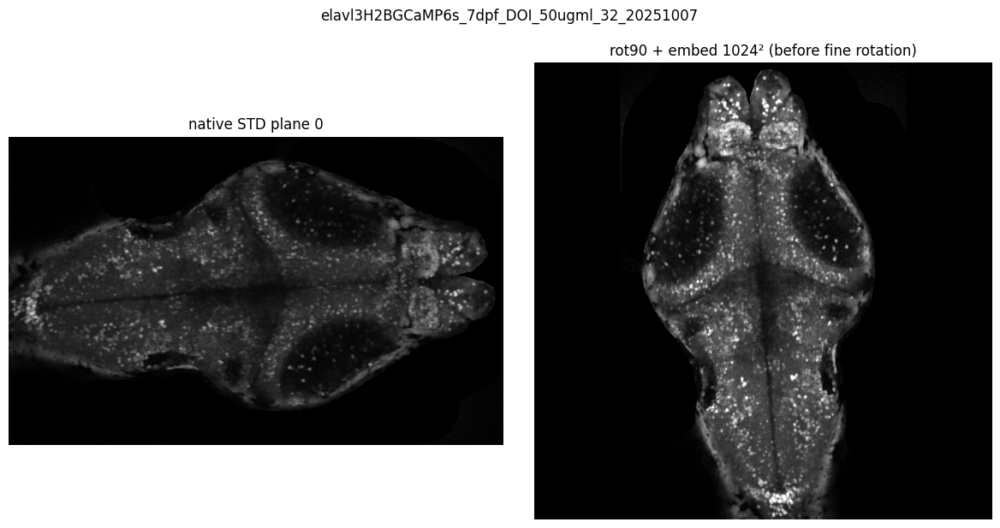

In [56]:
# Requires: `external_std_tiff`, `selected_plane`, `exp_folder` from setup cell above.

target_vmin = 5
target_vmax = 600
source_vmax = 1250  # used later with mapzebrain; tune when atlas cell has run

_raw = np.asarray(tifffile.imread(external_std_tiff), dtype=np.float64)
if _raw.ndim == 3:
    _raw = _raw[0]
elif _raw.ndim != 2:
    raise ValueError(f"Expected 2D or 3D array from STD tiff, got shape {_raw.shape}")

_m = float(np.nanmax(_raw))
experiment_std_scaled = _raw.copy()
if _m > 0:
    experiment_std_scaled = experiment_std_scaled / _m
experiment_std_scaled *= 2**10

# Initial orientation (fine CW rotation is applied in the next cell).
plot_img = np.rot90(experiment_std_scaled, k=1)
plot_img = sitkalignment.embed_image(plot_img, 1024)

print(f"STD file: {external_std_tiff.name}")
print(f"Native shape: {_raw.shape}  →  embedded: {plot_img.shape}")

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(_raw, cmap="gray")
ax[0].set_title(f"native STD plane {selected_plane}")
ax[0].axis("off")

ax[1].imshow(plot_img, cmap="gray", vmin=target_vmin, vmax=target_vmax)
ax[1].set_title(f"rot90 + embed 1024² (before fine rotation)")
ax[1].axis("off")
plt.suptitle(exp_folder.name, y=1.02)
plt.tight_layout()
plt.show()


### Fine clockwise rotation (then rot90 + embed 1024²)

Small in-plane rotation of the **native** STD (before `rot90`), then rebuilds **`plot_img`**.

- Set **`EXPERIMENT_CW_DEGREES`** (degrees **clockwise** on screen). Use `0` to skip.
- Uses `sitkalignment.rotate_image_2d` (same grid size as native; corners filled with 0).
- Re-applies `rot90` + `embed_image(1024)` so registration still sees a 1024×1024 canvas.

Re-run the **registration masks** cell below after changing this angle.


Fine rotation: 3.5° CW on native  →  embedded plot_img (1024, 1024)


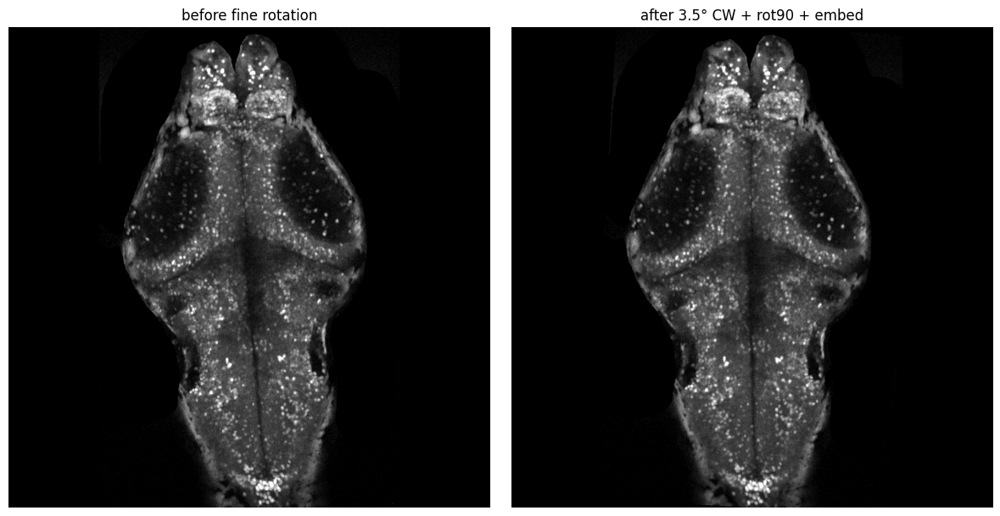

In [57]:
# Requires: `experiment_std_scaled` from the load cell above.

EXPERIMENT_CW_DEGREES = 3.5  # clockwise; tune (try 1–8°). Set 0 to keep load-cell orientation only.

_work = experiment_std_scaled
if EXPERIMENT_CW_DEGREES:
    _work = sitkalignment.rotate_image_2d(_work, EXPERIMENT_CW_DEGREES, cval=0.0)

plot_img = np.rot90(_work, k=1)
plot_img = sitkalignment.embed_image(plot_img, 1024)

print(
    f"Fine rotation: {EXPERIMENT_CW_DEGREES}° CW on native  →  "
    f"embedded plot_img {plot_img.shape}"
)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
_preview_before = sitkalignment.embed_image(np.rot90(experiment_std_scaled, k=1), 1024)
ax[0].imshow(_preview_before, cmap="gray", vmin=target_vmin, vmax=target_vmax)
ax[0].set_title("before fine rotation")
ax[0].axis("off")

ax[1].imshow(plot_img, cmap="gray", vmin=target_vmin, vmax=target_vmax)
ax[1].set_title(f"after {EXPERIMENT_CW_DEGREES}° CW + rot90 + embed")
ax[1].axis("off")
plt.tight_layout()
plt.show()


### Split experiment into sections (you define row edges)

Define **horizontal section boundaries** on the embedded **`plot_img`** (1024², row **0 = top**).

Edit **`EXPERIMENT_SECTION_ROW_EDGES`**: a strictly increasing list of row indices  
`[y0, y1, y2, …, yN]` with **`y0 = 0`**, **`yN = plot_img.shape[0]`** (usually 1024).  
That gives **N = len(edges) − 1** sections:

- section 0 → rows `[y0, y1)`
- section 1 → rows `[y1, y2)`
- …

Yellow lines are drawn at **internal** edges `y1, y2, …, y_{N−1}`.

Optional **`EXPERIMENT_SECTION_NAMES`**: one label per section (same length as number of sections).  
If omitted, names are `section_0`, `section_1`, …

Result is stored in **`EXPERIMENT_SECTIONS`** for piecewise registration.


4 sections on embedded experiment (1024×1024):
  section_0: rows [0, 220)
  section_1: rows [220, 525)
  section_2: rows [525, 790)
  section_3: rows [790, 1024)


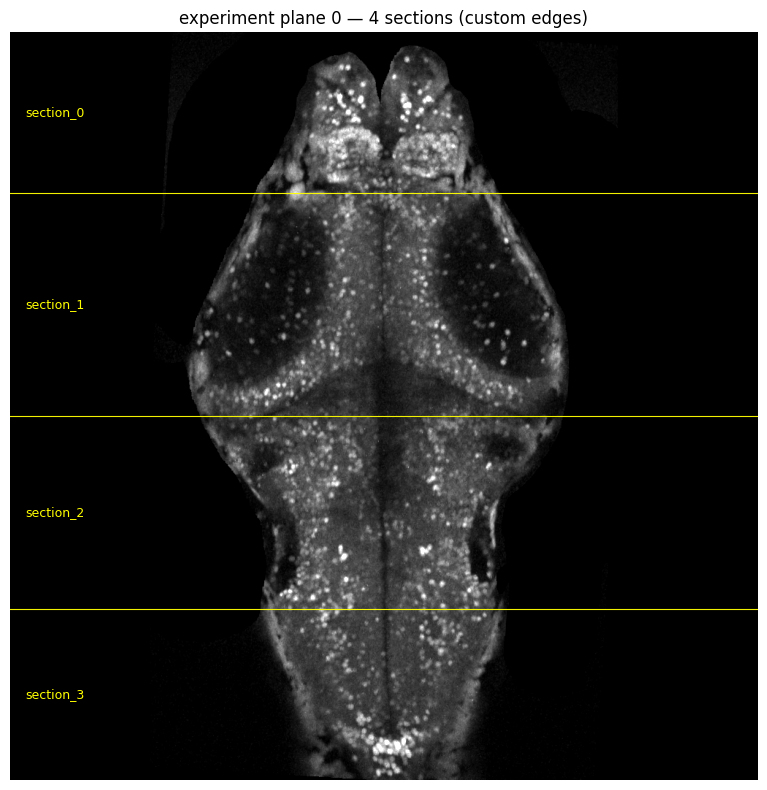

In [58]:
# Requires: `plot_img` from fine-rotation cell above.

# --- edit these ---
# Row boundaries on embedded experiment (half-open sections between consecutive edges).
# Example below = 4 sections on a 1024-tall image.
EXPERIMENT_SECTION_ROW_EDGES = [
    0,
    220,
    525,
    790,
    1024,
]

# Optional labels (len must match number of sections). Set None for section_0, section_1, ...
# EXPERIMENT_SECTION_NAMES = [
#     "anterior",
#     "antero_mid",
#     "postero_mid",
#     "posterior",
# ]
EXPERIMENT_SECTION_NAMES = None

_h, _w = plot_img.shape[:2]
EXPERIMENT_SECTION_ROW_EDGES = [int(y) for y in EXPERIMENT_SECTION_ROW_EDGES]

if len(EXPERIMENT_SECTION_ROW_EDGES) < 2:
    raise ValueError("EXPERIMENT_SECTION_ROW_EDGES needs at least [0, height]")
if EXPERIMENT_SECTION_ROW_EDGES[0] != 0 or EXPERIMENT_SECTION_ROW_EDGES[-1] != _h:
    raise ValueError(
        f"Edges must start at 0 and end at image height {_h}. "
        f"Got [{EXPERIMENT_SECTION_ROW_EDGES[0]}, …, {EXPERIMENT_SECTION_ROW_EDGES[-1]}]"
    )
if any(
    EXPERIMENT_SECTION_ROW_EDGES[i] >= EXPERIMENT_SECTION_ROW_EDGES[i + 1]
    for i in range(len(EXPERIMENT_SECTION_ROW_EDGES) - 1)
):
    raise ValueError("EXPERIMENT_SECTION_ROW_EDGES must be strictly increasing")

_n_sections = len(EXPERIMENT_SECTION_ROW_EDGES) - 1
if EXPERIMENT_SECTION_NAMES is not None:
    if len(EXPERIMENT_SECTION_NAMES) != _n_sections:
        raise ValueError(
            f"EXPERIMENT_SECTION_NAMES length {len(EXPERIMENT_SECTION_NAMES)} != {_n_sections} sections"
        )
    _names = list(EXPERIMENT_SECTION_NAMES)
else:
    _names = [f"section_{i}" for i in range(_n_sections)]

EXPERIMENT_SECTIONS = []
for _i in range(_n_sections):
    EXPERIMENT_SECTIONS.append(
        {
            "name": str(_names[_i]),
            "row_start": int(EXPERIMENT_SECTION_ROW_EDGES[_i]),
            "row_end": int(EXPERIMENT_SECTION_ROW_EDGES[_i + 1]),
        }
    )

print(f"{_n_sections} sections on embedded experiment ({_h}×{_w}):")
for _b in EXPERIMENT_SECTIONS:
    print(f"  {_b['name']}: rows [{_b['row_start']}, {_b['row_end']})")

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.imshow(plot_img, cmap="gray", vmin=target_vmin, vmax=target_vmax)
for _y in EXPERIMENT_SECTION_ROW_EDGES[1:-1]:
    ax.axhline(_y - 0.5, color="yellow", linewidth=0.8, alpha=0.95)
for _b in EXPERIMENT_SECTIONS:
    _yc = (_b["row_start"] + _b["row_end"]) / 2.0
    ax.text(
        _w * 0.02,
        _yc,
        _b["name"],
        color="yellow",
        fontsize=9,
        va="center",
        ha="left",
    )
ax.set_title(f"experiment plane {selected_plane} — {_n_sections} sections (custom edges)")
ax.axis("off")
plt.tight_layout()
plt.show()


### Load mapZebrain atlas slices (one z per experiment section)

Requires **`EXPERIMENT_SECTIONS`** from the section-split cell above.

Edit **`MAPZEBRAIN_Z_PER_SECTION`**: one atlas z index per section, **same order** as `EXPERIMENT_SECTIONS` (first entry = top section on the embedded experiment image).

Stores **`mapzebrain_by_section`** for piecewise registration. **`source_img`** / **`selected_mapzebrain_z`** are set from the **first** section for optional single-slice cells below.


Loaded 4 atlas slices from 359-slice stack:
  section_0: z=245, native (974, 597), rows [0, 220)
  section_1: z=285, native (974, 597), rows [220, 525)
  section_2: z=295, native (974, 597), rows [525, 790)
  section_3: z=318, native (974, 597), rows [790, 1024)


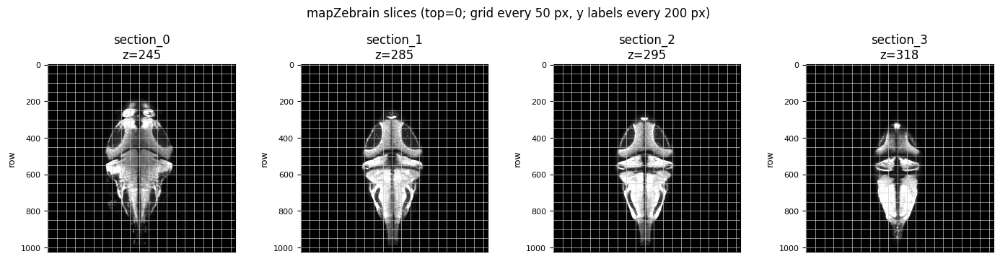

Section ↔ atlas z (re-run this cell after editing MAPZEBRAIN_Z_PER_SECTION):
  section_0: experiment rows [0, 220) -> z=245
  section_1: experiment rows [220, 525) -> z=285
  section_2: experiment rows [525, 790) -> z=295
  section_3: experiment rows [790, 1024) -> z=318


In [59]:
# Requires: EXPERIMENT_SECTIONS from the custom section cell above.
# One atlas z per section (same order as EXPERIMENT_SECTIONS: top experiment section first).
MAPZEBRAIN_Z_PER_SECTION = [
    245,  # section_0 — top experiment rows [0, …)
    285,  # section_1
    295,
    318,  # section_3 — bottom experiment rows
]

mapzebrain_img_path = Path(r'./reference_images/hindbrain/mapzebrain/T_AVG_HuCD.tif')

if 'EXPERIMENT_SECTIONS' not in globals():
    raise RuntimeError('Run the EXPERIMENT_SECTIONS cell above first.')

_n_sections = len(EXPERIMENT_SECTIONS)
MAPZEBRAIN_Z_PER_SECTION = [int(z) for z in MAPZEBRAIN_Z_PER_SECTION]
if len(MAPZEBRAIN_Z_PER_SECTION) != _n_sections:
    raise ValueError(
        f'MAPZEBRAIN_Z_PER_SECTION has {len(MAPZEBRAIN_Z_PER_SECTION)} entries but '
        f'EXPERIMENT_SECTIONS has {_n_sections}. They must match.'
    )

def _prepare_mapzebrain_slice(native_2d):
    emb = sitkalignment.embed_image(np.asarray(native_2d, dtype=np.float64), 1024)
    mx = float(emb.max())
    if mx > 0:
        emb = emb / mx
    return emb * (2**10)


_source_stack = tifffile.imread(str(mapzebrain_img_path))
_nz_atlas = int(_source_stack.shape[0])

mapzebrain_by_section = {}
for _section, _z in zip(EXPERIMENT_SECTIONS, MAPZEBRAIN_Z_PER_SECTION):
    _name = str(_section['name'])
    if not (0 <= _z < _nz_atlas):
        raise ValueError(f'mapzebrain_z={_z} for section {_name!r} out of range [0, {_nz_atlas})')
    _native = np.asarray(_source_stack[_z], dtype=np.float64)
    mapzebrain_by_section[_name] = {
        'mapzebrain_z': _z,
        'native': _native,
        'native_shape': _native.shape,
        'embedded': _prepare_mapzebrain_slice(_native),
    }

# Backward compat for optional single-slice workflow (first section).
_first_name = str(EXPERIMENT_SECTIONS[0]['name'])
source_img = mapzebrain_by_section[_first_name]['embedded']
mapzebrain_native = mapzebrain_by_section[_first_name]['native']
mapzebrain_native_shape = mapzebrain_by_section[_first_name]['native_shape']
selected_mapzebrain_z = mapzebrain_by_section[_first_name]['mapzebrain_z']

print(f'Loaded {len(mapzebrain_by_section)} atlas slices from {_nz_atlas}-slice stack:')
for _b in EXPERIMENT_SECTIONS:
    _e = mapzebrain_by_section[_b['name']]
    print(
        f"  {_b['name']}: z={_e['mapzebrain_z']}, native {_e['native_shape']}, "
        f"rows [{_b['row_start']}, {_b['row_end']})"
    )

# Preview grid (50 px grid lines; y labels every 200 px; same frame as ATLAS_METRIC_REGIONS).
_EMBED_GRID_STEP = 50
_EMBED_LABEL_STEP = 200
_GRID_KW = dict(color="0.82", linewidth=0.5, alpha=0.95, zorder=5)

_cols = min(4, _n_sections)
_rows = int(np.ceil(_n_sections / _cols))
fig, axes = plt.subplots(_rows, _cols, figsize=(4.2 * _cols, 4 * _rows))
_axes = np.atleast_1d(axes).ravel()
for _i, _b in enumerate(EXPERIMENT_SECTIONS):
    _ax = _axes[_i]
    _e = mapzebrain_by_section[_b['name']]
    _emb = _e['embedded']
    _h, _w = _emb.shape[:2]
    _ax.imshow(_emb, cmap='gray', vmax=700, aspect='equal')
    # Draw every grid line explicitly (avoids gaps at major tick positions).
    for _y in np.arange(0, _h, _EMBED_GRID_STEP):
        _ax.axhline(_y, **_GRID_KW)
    for _x in np.arange(0, _w, _EMBED_GRID_STEP):
        _ax.axvline(_x, **_GRID_KW)
    _ax.set_title(f"{_b['name']}\nz={_e['mapzebrain_z']}")
    _ax.set_ylabel("row", fontsize=9)
    _ax.set_yticks(np.arange(0, _h, _EMBED_LABEL_STEP))
    _ax.tick_params(axis="y", labelsize=8)
    _ax.tick_params(axis="x", bottom=False, labelbottom=False)
for _j in range(_n_sections, len(_axes)):
    _axes[_j].axis('off')
plt.suptitle(
    f'mapZebrain slices (top=0; grid every {_EMBED_GRID_STEP} px, y labels every {_EMBED_LABEL_STEP} px)',
    y=1.02,
)
fig.subplots_adjust(left=0.12, wspace=0.35)
plt.show()

print("Section ↔ atlas z (re-run this cell after editing MAPZEBRAIN_Z_PER_SECTION):")
for _b, _z in zip(EXPERIMENT_SECTIONS, MAPZEBRAIN_Z_PER_SECTION):
    print(f"  {_b['name']}: experiment rows [{_b['row_start']}, {_b['row_end']}) -> z={_z}")


section_0 z=245: experiment rows [0, 220) | moving mask 112640 px | atlas ROI {'row_start': 180, 'row_end': 290, 'col_start': 0, 'col_end': 1024}
section_1 z=285: experiment rows [220, 525) | moving mask 215040 px | atlas ROI {'row_start': 300, 'row_end': 510, 'col_start': 0, 'col_end': 1024}
section_2 z=295: experiment rows [525, 790) | moving mask 194560 px | atlas ROI {'row_start': 510, 'row_end': 700, 'col_start': 0, 'col_end': 1024}
section_3 z=318: experiment rows [790, 1024) | moving mask 331776 px | atlas ROI {'row_start': 700, 'row_end': 1024, 'col_start': 0, 'col_end': 1024}


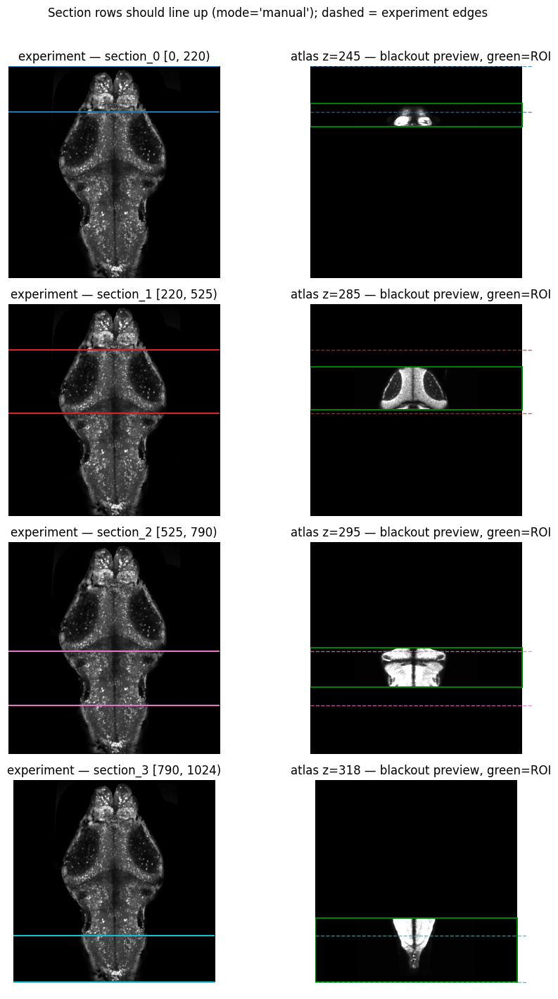

In [60]:
# Requires: mapzebrain_by_section, EXPERIMENT_SECTIONS from cells above.

ATLAS_MOVING_BLACKOUT = True  # zero atlas outside ROI before registration (see piecewise cell)

ATLAS_METRIC_COORD_FRAME = "embedded"  # or "native"

# How atlas moving-metric rows relate to experiment sections (yellow lines on plot_img):
#   "match_experiment_section" — same row_start/row_end as EXPERIMENT_SECTIONS (recommended)
#   "manual"                — use ATLAS_METRIC_REGIONS below (per-section overrides)
ATLAS_METRIC_ROW_MODE = "manual"

# When matching experiment rows, atlas columns: "content" (embed x-bounds) or "full" (0–1024)
ATLAS_METRIC_COL_SPAN = "content"

# --- manual ROIs only (used when ATLAS_METRIC_ROW_MODE == "manual") ---
def _default_embedded_roi(_native_shape):
    _y0, _y1, _x0, _x1 = sitkalignment.embed_content_bounds(_native_shape, 1024)[1:]
    return {
        "row_start": int(_y0),
        "row_end": int(_y1),
        "col_start": int(_x0),
        "col_end": int(_x1),
    }


if ATLAS_METRIC_ROW_MODE == "match_experiment_section":
    ATLAS_METRIC_REGIONS = sitkalignment.build_atlas_metric_regions_from_experiment_sections(
        EXPERIMENT_SECTIONS,
        mapzebrain_by_section,
        col_span=ATLAS_METRIC_COL_SPAN,
    )
elif ATLAS_METRIC_ROW_MODE == "manual":
    ATLAS_METRIC_REGIONS = [
        _default_embedded_roi(mapzebrain_by_section[str(b["name"])]["native_shape"])
        for b in EXPERIMENT_SECTIONS
    ]
    # Example per-section override:
    ATLAS_METRIC_REGIONS[0] = {"row_start": 180, "row_end": 290, "col_start": 0, "col_end": 1024}
    ATLAS_METRIC_REGIONS[1] = {"row_start": 300, "row_end": 510, "col_start": 0, "col_end": 1024}
    ATLAS_METRIC_REGIONS[2] = {"row_start": 510, "row_end": 700, "col_start": 0, "col_end": 1024}
    ATLAS_METRIC_REGIONS[3] = {"row_start": 700, "row_end": 1024, "col_start": 0, "col_end": 1024}
else:
    raise ValueError(
        'ATLAS_METRIC_ROW_MODE must be "match_experiment_section" or "manual"'
    )

if len(ATLAS_METRIC_REGIONS) != len(EXPERIMENT_SECTIONS):
    raise ValueError(
        f"ATLAS_METRIC_REGIONS length {len(ATLAS_METRIC_REGIONS)} != "
        f"{len(EXPERIMENT_SECTIONS)} sections"
    )

_frame = str(ATLAS_METRIC_COORD_FRAME).lower().strip()
if _frame not in ("embedded", "native"):
    raise ValueError('ATLAS_METRIC_COORD_FRAME must be "embedded" or "native"')

for _section, _roi in zip(EXPERIMENT_SECTIONS, ATLAS_METRIC_REGIONS):
    _name = str(_section["name"])
    _emb = mapzebrain_by_section[_name]["embedded"]
    _native_shape = mapzebrain_by_section[_name]["native_shape"]
    _roi = dict(_roi)
    for _k in ("row_start", "row_end", "col_start", "col_end"):
        if _k not in _roi:
            raise ValueError(f"{_name} ROI missing {_k!r}")

    if _frame == "embedded":
        _mask = sitkalignment.registration_mask_embedded_rectangle(_emb.shape, **_roi)
    else:
        _mask = sitkalignment.registration_mask_native_rectangle(
            _emb.shape, _native_shape, **_roi
        )

    mapzebrain_by_section[_name]["atlas_metric_roi"] = _roi
    mapzebrain_by_section[_name]["atlas_metric_coord_frame"] = _frame
    mapzebrain_by_section[_name]["moving_metric_mask"] = _mask
    _exp_px = (_section["row_end"] - _section["row_start"]) * (_roi["col_end"] - _roi["col_start"])
    print(
        f"{_name} z={mapzebrain_by_section[_name]['mapzebrain_z']}: "
        f"experiment rows [{_section['row_start']}, {_section['row_end']}) | "
        f"moving mask {_mask.sum()} px | atlas ROI {_roi}"
    )

# --- Preview: experiment sections vs atlas metric (same row sections when mode=match) ---
_n = len(EXPERIMENT_SECTIONS)
fig, axes = plt.subplots(_n, 2, figsize=(10, 3.5 * _n))
if _n == 1:
    axes = np.asarray([axes])
_cmap = plt.cm.tab10(np.linspace(0, 1, max(_n, 1)))

for _i, _b in enumerate(EXPERIMENT_SECTIONS):
    _name = _b["name"]
    rs, re = int(_b["row_start"]), int(_b["row_end"])
    _roi = mapzebrain_by_section[_name]["atlas_metric_roi"]

    ax_exp = axes[_i, 0]
    ax_exp.imshow(plot_img, cmap="gray", vmin=target_vmin, vmax=target_vmax)
    ax_exp.axhline(rs, color=_cmap[_i], lw=1.5)
    ax_exp.axhline(re, color=_cmap[_i], lw=1.5)
    ax_exp.set_title(f"experiment — {_name} [{rs}, {re})")
    ax_exp.axis("off")

    ax_at = axes[_i, 1]
    _mask = mapzebrain_by_section[_name]["moving_metric_mask"]
    _atlas_show = (
        sitkalignment.apply_moving_blackout(
            mapzebrain_by_section[_name]["embedded"], _mask
        )
        if ATLAS_MOVING_BLACKOUT
        else mapzebrain_by_section[_name]["embedded"]
    )
    ax_at.imshow(_atlas_show, cmap="gray", vmax=700)
    _cs, _ce = _roi["col_start"], _roi["col_end"]
    _rs, _re = _roi["row_start"], _roi["row_end"]
    ax_at.plot([_cs, _ce, _ce, _cs, _cs], [_rs, _rs, _re, _re, _rs], "g-", lw=1.5)
    ax_at.axhline(rs, color=_cmap[_i], lw=1.0, ls="--", alpha=0.8)
    ax_at.axhline(re, color=_cmap[_i], lw=1.0, ls="--", alpha=0.8)
    _at_title = "blackout preview" if ATLAS_MOVING_BLACKOUT else "full slice"
    ax_at.set_title(
        f"atlas z={mapzebrain_by_section[_name]['mapzebrain_z']} — {_at_title}, green=ROI"
    )
    ax_at.axis("off")

plt.suptitle(
    f"Section rows should line up (mode={ATLAS_METRIC_ROW_MODE!r}); dashed = experiment edges",
    y=1.01,
)
plt.tight_layout()
plt.show()


### Unaligned experiment + mapzebrain preview


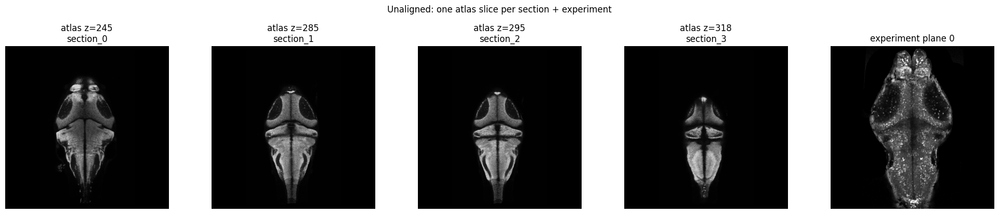

In [61]:
_n_atlas = len(mapzebrain_by_section) if 'mapzebrain_by_section' in globals() else 1
if _n_atlas > 1:
    _cols = min(4, _n_atlas)
    _rows = int(np.ceil(_n_atlas / _cols))
    fig, axes = plt.subplots(_rows, _cols + 1, figsize=(4 * (_cols + 1), 4 * _rows))
    _axes = np.atleast_2d(axes)
    for _i, _b in enumerate(EXPERIMENT_SECTIONS):
        _r, _c = divmod(_i, _cols)
        _ax = _axes[_r, _c]
        _ax.imshow(mapzebrain_by_section[_b['name']]['embedded'], cmap='gray', vmin=0, vmax=source_vmax)
        _ax.set_title(f"atlas z={mapzebrain_by_section[_b['name']]['mapzebrain_z']}\n{_b['name']}")
        _ax.axis('off')
    for _j in range(_n_atlas, _rows * _cols):
        _r, _c = divmod(_j, _cols)
        _axes[_r, _c].axis('off')
    _ax_exp = _axes[0, -1] if _rows == 1 else _axes[:, -1].ravel()[0]
    _ax_exp.imshow(plot_img, cmap='gray', vmin=target_vmin, vmax=target_vmax)
    _ax_exp.set_title(f'experiment plane {selected_plane}')
    _ax_exp.axis('off')
    plt.suptitle('Unaligned: one atlas slice per section + experiment', y=1.02)
    plt.tight_layout()
    plt.show()
else:
    fig, ax = plt.subplots(1, 3, figsize=(14, 6))
    ax[0].imshow(source_img, cmap='gray', vmin=0, vmax=source_vmax)
    ax[1].imshow(plot_img, cmap='gray', vmin=target_vmin, vmax=target_vmax)
    merge = np.zeros((source_img.shape[0], source_img.shape[1], 3))
    merge[:, :, 0] = 2 * source_img / max(float(source_img.max()), 1.0)
    merge[:, :, 1] = 2 * plot_img / max(float(plot_img.max()), 1.0)
    ax[2].imshow(merge)
    ax[0].set_title('mapzebrain (unaligned)')
    ax[1].set_title(f'experiment plane {selected_plane} (unaligned)')
    ax[2].set_title('merge (unaligned)')
    for a in ax:
        a.axis('off')
    plt.show()


### Alignment (piecewise only)

This notebook uses **piecewise** registration (one Elastix run per experiment row section + atlas z). There is no separate global single-slice `register_image2` step.

Continue to **Piecewise alignment** below after the unaligned preview.


## Piecewise alignment (one experiment plane → multiple atlas z sections)

Use when a single STD projection is **tilted front–back**. Run **one Elastix registration per section**:

- **Fixed** = experiment plane, row section zeroed outside the section (optional `registration_fixed_mask` intersection)
- **Moving** = atlas z slice, ROI zeroed outside **`ATLAS_METRIC_REGIONS`** when **`ATLAS_MOVING_BLACKOUT`** is on (default)
- Registration uses **SimpleITK Elastix** on those images (no `-fMask`/`-mMask` CLI); masks are kept in `PIECEWISE_RESULTS` for QC only
- Separate transform folder per section: `alignment_rev_plane{plane}_piecewise_{name}/`


### Piecewise config (sections + atlas z)

**`REGION_SECTIONS`** is built automatically from **`EXPERIMENT_SECTIONS`** + **`MAPZEBRAIN_Z_PER_SECTION`**.

Run the section preview below, then the registration loop.


In [62]:
# --- Piecewise config ---
USE_PIECEWISE_ALIGNMENT = True  # primary workflow for tilted STD
PIECEWISE_SCALE_PENALTY = 150
PIECEWISE_ITERATIONS = (10000, 500)
PIECEWISE_SAVE_TAG = f"alignment_rev_plane{selected_plane}_piecewise"

if 'EXPERIMENT_SECTIONS' not in globals() or 'MAPZEBRAIN_Z_PER_SECTION' not in globals():
    raise RuntimeError('Run EXPERIMENT_SECTIONS and mapZebrain multi-slice cells first.')

if 'mapzebrain_by_section' not in globals():
    raise RuntimeError('Run the mapZebrain load cell (defines mapzebrain_by_section).')

REGION_SECTIONS = []
for _section, _z in zip(EXPERIMENT_SECTIONS, MAPZEBRAIN_Z_PER_SECTION):
    _name = str(_section['name'])
    REGION_SECTIONS.append(
        {
            'name': _name,
            'row_start': int(_section['row_start']),
            'row_end': int(_section['row_end']),
            'mapzebrain_z': int(_z),
            'atlas_metric_roi': dict(mapzebrain_by_section[_name]['atlas_metric_roi']),
            'atlas_metric_coord_frame': mapzebrain_by_section[_name]['atlas_metric_coord_frame'],
        }
    )


def piecewise_section_mask(shape, row_start, row_end):
    """uint8 mask: 1 inside [row_start, row_end), else 0."""
    h, w = shape[:2]
    mask = np.zeros((h, w), dtype=np.uint8)
    rs, re = int(row_start), int(row_end)
    if rs < 0 or re > h or rs >= re:
        raise ValueError(f"Invalid row section [{rs}, {re}) for height {h}")
    mask[rs:re, :] = 1
    return mask


def validate_region_sections(sections, canvas_size=1024):
    covered = np.zeros(int(canvas_size), dtype=bool)
    names = set()
    for b in sections:
        name = str(b["name"])
        if name in names:
            raise ValueError(f"Duplicate region name: {name}")
        names.add(name)
        rs, re = int(b["row_start"]), int(b["row_end"])
        if covered[rs:re].any():
            raise ValueError(
                f"Overlapping row section for {name!r} [{rs}, {re}). Sections must be disjoint."
            )
        covered[rs:re] = True
    gap = int(canvas_size) - int(covered.sum())
    if gap:
        print(
            f"[piecewise] {gap} embedded row(s) not in any section (no metric there). "
            "That is OK if you do not need alignment there."
        )


if "plot_img" not in globals():
    raise RuntimeError("Run the experiment pipeline cells first (defines plot_img).")

validate_region_sections(REGION_SECTIONS, canvas_size=plot_img.shape[0])
print(f"Configured {len(REGION_SECTIONS)} piecewise sections:")
for _b in REGION_SECTIONS:
    print(
        f"  {_b['name']}: rows [{_b['row_start']}, {_b['row_end']}), "
        f"atlas z={_b['mapzebrain_z']}"
    )


Configured 4 piecewise sections:
  section_0: rows [0, 220), atlas z=245
  section_1: rows [220, 525), atlas z=285
  section_2: rows [525, 790), atlas z=295
  section_3: rows [790, 1024), atlas z=318


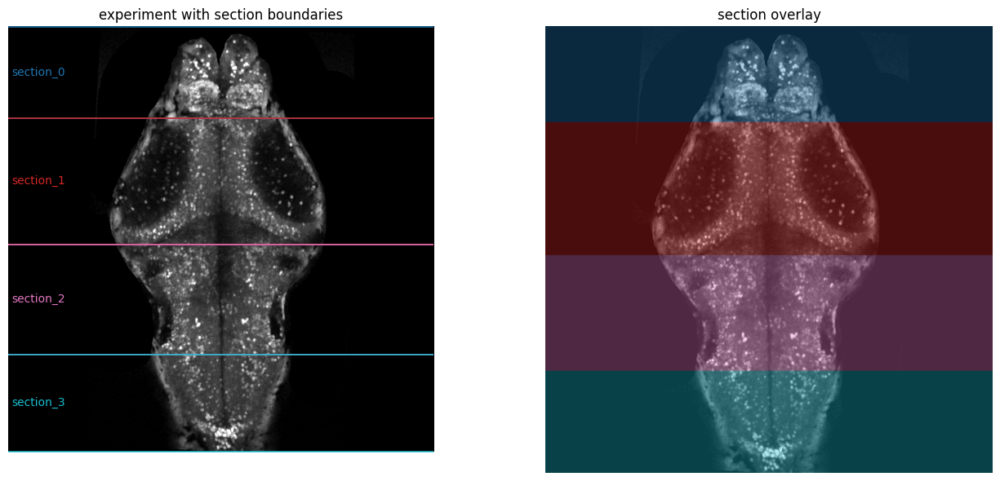

In [63]:
# Preview disjoint sections on the experiment plane (tune REGION_SECTIONS row cuts).
_h = plot_img.shape[0]
_overlay = np.zeros((_h, plot_img.shape[1], 3), dtype=np.float32)
_cmap = plt.cm.tab10(np.linspace(0, 1, max(len(REGION_SECTIONS), 1)))

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(plot_img, cmap="gray", vmin=target_vmin, vmax=target_vmax)
for _i, _b in enumerate(REGION_SECTIONS):
    rs, re = int(_b["row_start"]), int(_b["row_end"])
    _col = _cmap[_i % len(_cmap)]
    axes[0].axhline(rs, color=_col, lw=1.2, alpha=0.9)
    axes[0].axhline(re, color=_col, lw=1.2, alpha=0.9)
    axes[0].text(
        8,
        (rs + re) // 2,
        _b["name"],
        color=_col,
        fontsize=10,
        va="center",
        bbox=dict(boxstyle="round,pad=0.2", fc="black", alpha=0.45),
    )
    _overlay[rs:re, :, :] = _col[:3]
axes[0].set_title("experiment with section boundaries")
axes[0].axis("off")

axes[1].imshow(plot_img, cmap="gray", vmin=target_vmin, vmax=target_vmax)
axes[1].imshow(_overlay, alpha=0.35)
axes[1].set_title("section overlay")
axes[1].axis("off")
plt.tight_layout()
plt.show()


### Run piecewise Elastix (one transform folder per section)

Requires **`target_vmin`**, **`target_vmax`**, **`source_vmax`** from the experiment load cells (`target_vmin` / `target_vmax` / `source_vmax`).

Blackouts experiment row section + atlas ROI, then runs SimpleITK Elastix (no `-fMask`/`-mMask`). Reuses **`registration_fixed_mask`** when defined (intersected with each section). Writes `{PIECEWISE_SAVE_TAG}_{section_name}/` with `transform_pmap_*.txt`.

Outputs **`PIECEWISE_RESULTS[name]`** with `save_path`, `warped`, `mapzebrain_z`, row range, and masks.


In [64]:
%%time
# Piecewise registration loop
if "plot_img" not in globals():
    raise RuntimeError("Run experiment + section cells first (defines plot_img).")
if "mapzebrain_by_section" not in globals():
    raise RuntimeError("Run the mapZebrain multi-slice cell (defines mapzebrain_by_section).")
if "moving_metric_mask" not in next(iter(mapzebrain_by_section.values())):
    raise RuntimeError("Run the atlas metric regions cell first.")
if "REGION_SECTIONS" not in globals():
    raise RuntimeError("Run the piecewise config cell (defines REGION_SECTIONS).")

_reg_plot_piece = minmax_scaler(plot_img, vmin=target_vmin, vmax=target_vmax)
_global_fixed = globals().get("registration_fixed_mask")
if _global_fixed is None:
    _global_fixed = np.ones(plot_img.shape, dtype=np.uint8)

PIECEWISE_RESULTS = {}

for _section in REGION_SECTIONS:
    _name = str(_section["name"])
    _z = int(_section["mapzebrain_z"])

    if _name not in mapzebrain_by_section:
        raise KeyError(f"Section {_name!r} missing from mapzebrain_by_section")
    if int(mapzebrain_by_section[_name]["mapzebrain_z"]) != _z:
        raise ValueError(
            f"z mismatch for {_name}: REGION_SECTIONS has {_z}, "
            f"mapzebrain_by_section has {mapzebrain_by_section[_name]['mapzebrain_z']}"
        )

    _moving = np.asarray(mapzebrain_by_section[_name]["embedded"], dtype=np.float64)
    _native_shape = mapzebrain_by_section[_name]["native_shape"]
    _reg_moving = minmax_scaler(_moving, vmin=0, vmax=source_vmax)

    _section_mask = piecewise_section_mask(
        plot_img.shape, _section["row_start"], _section["row_end"]
    )
    _fixed_mask = (_global_fixed.astype(np.uint8) * _section_mask).astype(np.uint8)
    if _fixed_mask.sum() == 0:
        raise ValueError(f"Empty fixed mask for section {_name}")

    # Rebuild moving mask from ROI so edits to ATLAS_METRIC_REGIONS are not stale.
    _roi = _section.get("atlas_metric_roi") or mapzebrain_by_section[_name].get("atlas_metric_roi")
    _frame = _section.get("atlas_metric_coord_frame") or mapzebrain_by_section[_name].get(
        "atlas_metric_coord_frame", "embedded"
    )
    if _roi is None:
        raise ValueError(f"No atlas_metric_roi for section {_name!r} — run atlas metric cell")
    _moving_mask = sitkalignment.moving_metric_mask_from_roi(
        _moving.shape,
        _native_shape,
        _roi,
        coord_frame=_frame,
    )
    _n_mask = int(_moving_mask.sum())
    _n_total = int(_moving_mask.size)
    _fixed_px = int(_fixed_mask.sum())
    print(
        f"  {_name} fixed metric: {_fixed_px} px (experiment rows "
        f"[{_section['row_start']}, {_section['row_end']}))"
    )
    print(
        f"  {_name} moving metric: {_n_mask}/{_n_total} px "
        f"({100.0 * _n_mask / _n_total:.1f}% of slice) atlas rows "
        f"[{_roi['row_start']}, {_roi['row_end']})"
    )
    if _moving_mask.sum() == 0:
        raise ValueError(f"Empty moving mask for section {_name}")

    _blackout_moving = bool(globals().get("ATLAS_MOVING_BLACKOUT", True))
    if _blackout_moving:
        _reg_moving = sitkalignment.apply_registration_blackout(_reg_moving, _moving_mask)
        print(f"  {_name} moving blackout: outside atlas ROI set to 0")

    _reg_fixed = sitkalignment.apply_registration_blackout(
        np.asarray(_reg_plot_piece, dtype=np.float64), _fixed_mask
    )
    print(f"  {_name} fixed blackout: outside experiment row section set to 0")

    _save = exp_folder.joinpath(f"{PIECEWISE_SAVE_TAG}_{_name}")
    print(
        f"Registering section {_name!r}: rows [{_section['row_start']}, {_section['row_end']}), "
        f"z={_z} -> {_save}"
    )

    _warped = sitkalignment.register_image2(
        _reg_fixed,
        _reg_moving,
        _save,
        scalePenalty=PIECEWISE_SCALE_PENALTY,
        iterations=PIECEWISE_ITERATIONS,
    )

    PIECEWISE_RESULTS[_name] = {
        "save_path": Path(_save),
        "warped": _warped,
        "mapzebrain_z": _z,
        "row_start": int(_section["row_start"]),
        "row_end": int(_section["row_end"]),
        "fixed_mask": _fixed_mask,
        "moving_mask": _moving_mask,
        "embedded_moving": _moving,
        "reg_fixed": np.asarray(_reg_fixed, dtype=np.float64),
        "reg_moving": np.asarray(_reg_moving, dtype=np.float64),
        "moving_blackout": _blackout_moving,
    }

print("Done. Transforms:")
for _k, _v in PIECEWISE_RESULTS.items():
    print(f"  {_k}: {_v['save_path'].resolve()}")


  section_0 fixed metric: 225280 px (experiment rows [0, 220))
  section_0 moving metric: 112640/1048576 px (10.7% of slice) atlas rows [180, 290)
  section_0 moving blackout: outside atlas ROI set to 0
  section_0 fixed blackout: outside experiment row section set to 0
Registering section 'section_0': rows [0, 220), z=245 -> /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/alignment_rev_plane0_piecewise_section_0
ELASTIX version: 5.0.1
Command line options from ElastixBase:
-fMask    unspecified, so no fixed mask used
-mMask    unspecified, so no moving mask used
-out      /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/alignment_rev_plane0_piecewise_section_0/
-threads  unspecified, so all available threads are used
Command line options from TransformBase:
-t0       unspecified, so no initial transform used

Reading images...
Reading images took 0 ms.

  A default pyramid schedule is used.
  A default pyramid schedule is used.
  

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


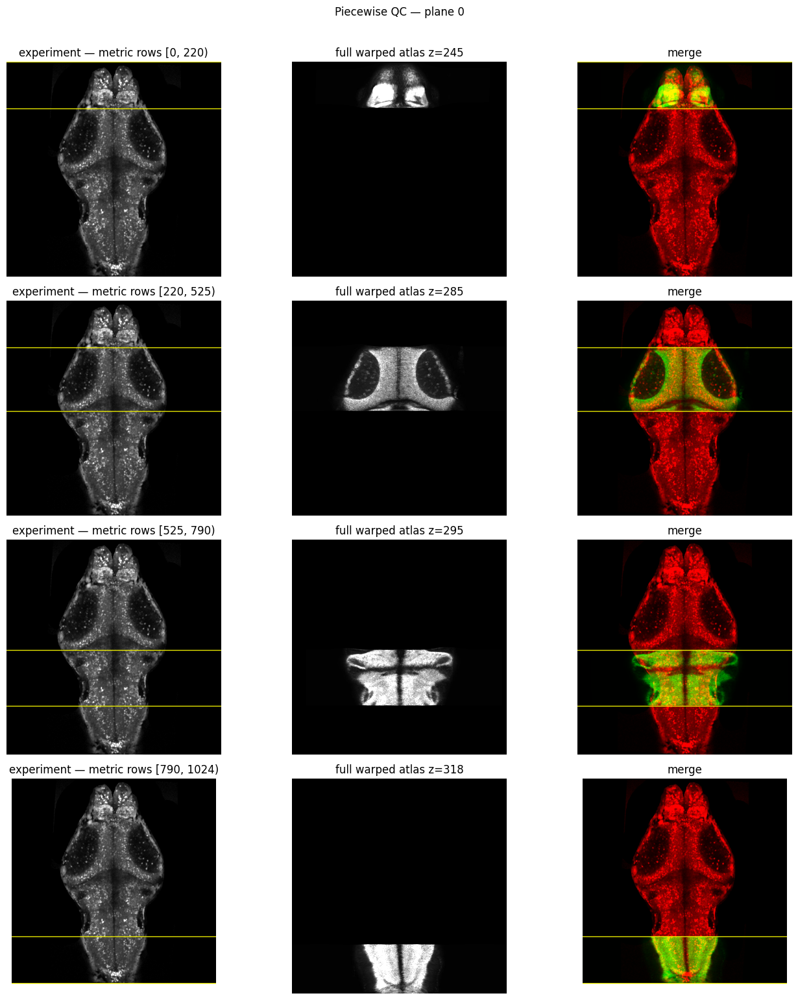

In [65]:
# QC: per-section — full warped atlas; experiment shows metric row section (yellow lines).
if not PIECEWISE_RESULTS:
    raise RuntimeError("Run the piecewise registration cell first.")

_n = len(PIECEWISE_RESULTS)
fig, axes = plt.subplots(_n, 3, figsize=(14, 3.8 * _n))
if _n == 1:
    axes = np.asarray([axes])

for _i, (_name, _res) in enumerate(PIECEWISE_RESULTS.items()):
    rs, re = int(_res["row_start"]), int(_res["row_end"])
    _warped = np.asarray(_res["warped"], dtype=np.float64)

    axes[_i, 0].imshow(plot_img, cmap="gray", vmin=target_vmin, vmax=target_vmax)
    axes[_i, 0].axhline(rs, color="yellow", lw=1.0, alpha=0.9)
    axes[_i, 0].axhline(re, color="yellow", lw=1.0, alpha=0.9)
    axes[_i, 0].set_title(f"experiment — metric rows [{rs}, {re})")
    axes[_i, 0].axis("off")

    axes[_i, 1].imshow(_warped, cmap="gray", vmin=0, vmax=1000)
    axes[_i, 1].set_title(f"full warped atlas z={_res['mapzebrain_z']}")
    axes[_i, 1].axis("off")

    _merge = np.zeros((*plot_img.shape, 3))
    _merge[:, :, 0] = 3 * plot_img / max(float(plot_img.max()), 1.0)
    _merge[:, :, 1] = 1 * _warped / max(float(_warped.max()), 1.0)
    axes[_i, 2].imshow(_merge)
    axes[_i, 2].axhline(rs, color="yellow", lw=1.0, alpha=0.9)
    axes[_i, 2].axhline(re, color="yellow", lw=1.0, alpha=0.9)
    axes[_i, 2].set_title("merge")
    axes[_i, 2].axis("off")

fig.suptitle(f"Piecewise QC — plane {selected_plane}", y=1.01)
plt.tight_layout()
plt.show()


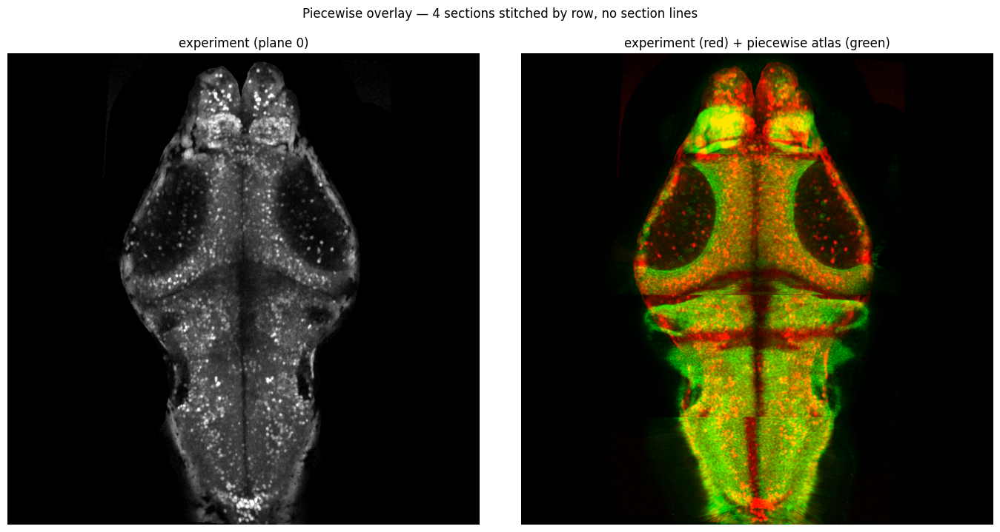

In [35]:
# Side-by-side: experiment only vs experiment (red) + piecewise warped sections (green).
if not PIECEWISE_RESULTS:
    raise RuntimeError("Run the piecewise registration cell first.")

_warped_piecewise = sitkalignment.piecewise_composite_warped(
    PIECEWISE_RESULTS, shape=plot_img.shape[:2]
)

_exp_mx = max(float(plot_img.max()), 1.0)
_atlas_mx = max(float(_warped_piecewise.max()), 1.0)

_merge_rgb = np.zeros((*plot_img.shape, 3), dtype=np.float32)
_merge_rgb[:, :, 0] = 3.0 * plot_img / _exp_mx
_merge_rgb[:, :, 1] = _warped_piecewise / _atlas_mx

fig, axes = plt.subplots(1, 2, figsize=(14, 7))
axes[0].imshow(plot_img, cmap="gray", vmin=target_vmin, vmax=target_vmax)
axes[0].set_title(f"experiment (plane {selected_plane})")
axes[0].axis("off")

axes[1].imshow(np.clip(_merge_rgb, 0, 1))
axes[1].set_title("experiment (red) + piecewise atlas (green)")
axes[1].axis("off")

plt.suptitle(
    f"Piecewise overlay — {len(PIECEWISE_RESULTS)} sections stitched by row, no section lines",
    y=1.02,
)
plt.tight_layout()
plt.show()


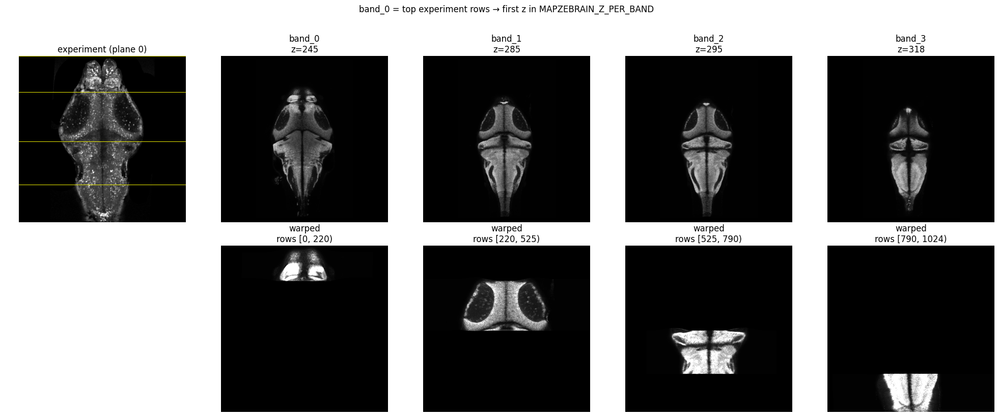

In [47]:
# Overview: full experiment + per-section reference | full warped atlas.
if not PIECEWISE_RESULTS:
    raise RuntimeError("Run the piecewise registration cell first.")

_n = len(PIECEWISE_RESULTS)
fig, axes = plt.subplots(2, _n + 1, figsize=(4 * (_n + 1), 8))
axes[0, 0].imshow(plot_img, cmap="gray", vmin=target_vmin, vmax=target_vmax)
for _b in REGION_SECTIONS:
    axes[0, 0].axhline(int(_b["row_start"]), color="yellow", lw=0.8, alpha=0.85)
axes[0, 0].set_title(f"experiment (plane {selected_plane})")
axes[0, 0].axis("off")
axes[1, 0].axis("off")

for _j, (_name, _res) in enumerate(PIECEWISE_RESULTS.items()):
    _ref = np.asarray(mapzebrain_by_section[_name]["embedded"], dtype=np.float64)
    _warped = np.asarray(_res["warped"], dtype=np.float64)
    rs, re = int(_res["row_start"]), int(_res["row_end"])
    axes[0, _j + 1].imshow(_ref, cmap="gray", vmin=0, vmax=source_vmax)
    axes[0, _j + 1].set_title(f"{_name}\nz={_res['mapzebrain_z']}")
    axes[0, _j + 1].axis("off")
    axes[1, _j + 1].imshow(_warped, cmap="gray", vmin=0, vmax=1000)
    axes[1, _j + 1].set_title(f"warped\nrows [{rs}, {re})")
    axes[1, _j + 1].axis("off")

plt.suptitle("section_0 = top experiment rows → first z in MAPZEBRAIN_Z_PER_SECTION", y=1.02)
plt.tight_layout()
plt.show()
